# Clase práctica 3: atributos visuales

**Profesor de Cátedra:** José M. Saavedra.

**Profesor Auxiliar:** Cristóbal Loyola (cloyola@dcc.uchile.cl)

Este tutorial muestra cómo ejecutar, en un entorno de Google Colab, el código del repositorio [jmsaavedrar/visual_attributes](https://github.com/jmsaavedrar/visual_attributes/). El código permite realizar búsquedas por similitud a partir de capas ocultas de una red neuronal convolucional. Para ejecutarlo, también necesitaremos el repositorio base [jmsaavedrar/convnet2](https://github.com/jmsaavedrar/convnet2).

El primer paso será clonar los repositorios en el entorno de Colab:

In [ ]:
!git clone https://github.com/jmsaavedrar/convnet2.git
!git clone https://github.com/jmsaavedrar/visual_attributes.git

Cloning into 'convnet2'...
remote: Enumerating objects: 272, done.
remote: Counting objects: 100% (272/272), done.
remote: Compressing objects: 100% (184/184), done.
remote: Total 272 (delta 171), reused 157 (delta 81), pack-reused 0
Receiving objects: 100% (272/272), 76.47 KiB | 2.94 MiB/s, done.
Resolving deltas: 100% (171/171), done.
Cloning into 'visual_attributes'...
remote: Enumerating objects: 43, done.
remote: Counting objects: 100% (43/43), done.
remote: Compressing objects: 100% (38/38), done.
remote: Total 43 (delta 19), reused 19 (delta 4), pack-reused 0
Unpacking objects: 100% (43/43), done.


In [ ]:
!pwd  # muestra el directorio actual
!ls   # muestra el contenido de este (archivos y directorios)

/content
convnet2  sample_data  visual_attributes


## Preparación de los datos

In [ ]:
# Crear directorio para los datos 
!mkdir /content/data
!ls /content/

convnet2  data	sample_data  visual_attributes


In [ ]:
# Descargar y descomprimir los datos
%cd /content/data
!wget https://www.dropbox.com/s/ri743kwqh8t6a7r/dataset_atributos.zip
!unzip -q dataset_atributos.zip
!rm dataset_atributos.zip
!ls

/content/data
--2021-10-19 02:05:34--  https://www.dropbox.com/s/ri743kwqh8t6a7r/dataset_atributos.zip
Resolving www.dropbox.com (www.dropbox.com)... 162.125.3.18, 2620:100:6018:18::a27d:312
Connecting to www.dropbox.com (www.dropbox.com)|162.125.3.18|:443... connected.
HTTP request sent, awaiting response... 301 Moved Permanently
Location: /s/raw/ri743kwqh8t6a7r/dataset_atributos.zip [following]
--2021-10-19 02:05:34--  https://www.dropbox.com/s/raw/ri743kwqh8t6a7r/dataset_atributos.zip
Reusing existing connection to www.dropbox.com:443.
HTTP request sent, awaiting response... 302 Found
Location: https://ucca42fb20d315499d7a7eece3f4.dl.dropboxusercontent.com/cd/0/inline/BYTfK8sjt6jcjjSTcrhrdm7XoRsh8PSsZYEYidOLCggoH-FGTxY6jicpviU9VoFkx5p6j-DhRVIeQrG2GmuuWBbDEmttwyVHcRYCi_evcLtCyArw6Unih-yBYYdyuo4FRDDLpOnDm5cup68Uzv-RbuPx/file# [following]
--2021-10-19 02:05:34--  https://ucca42fb20d315499d7a7eece3f4.dl.dropboxusercontent.com/cd/0/inline/BYTfK8sjt6jcjjSTcrhrdm7XoRsh8PSsZYEYidOLCggoH-FGT

In [ ]:
# Creamos directorios para la búsqueda por similitud
!mkdir /content/data/features_color
!mkdir /content/data/features_color/ssearch

!mkdir /content/data/features_textura
!mkdir /content/data/features_textura/ssearch

In [ ]:
# Generamos un archivo catalog.txt que contiene la ruta de las imágenes
%cd /content/data/dataset_atributos

import os

filenames = []
thisdir = os.getcwd()  # current working directory
print(f"directorio actual: {thisdir}")
# r=root, d=directories, f = files
for r, d, f in os.walk(thisdir):
    for file in f:
        if file.endswith(".jpg") or file.endswith(".jpeg") or file.endswith(".png"):
            filenames.append(os.path.join(r, file))
        else:
            print(os.path.join(r, file))

print(f"total de imágenes: {len(filenames)}")

# Escribir la lista de imágenes en un archivo de texto para color
catalog_dir = "/content/data/features_color/ssearch"
catalog_filename = os.path.join(catalog_dir, "catalog.txt")

with open(catalog_filename, 'w') as f:
    f.write("\n".join(map(str, filenames)))
print(f"Catálogo guardado en {catalog_filename}")


# Escribir la lista de imágenes en un archivo de texto para textura
catalog_dir = "/content/data/features_textura/ssearch"
catalog_filename = os.path.join(catalog_dir, "catalog.txt")

with open(catalog_filename, 'w') as f:
    f.write("\n".join(map(str, filenames)))

print(f"Catálogo guardado en {catalog_filename}")

/content/data/dataset_atributos
directorio actual: /content/data/dataset_atributos
total de imágenes: 2000
Catálogo guardado en /content/data/features_color/ssearch/catalog.txt
Catálogo guardado en /content/data/features_textura/ssearch/catalog.txt


## Extracción de features

En este paso debemos modificar algunos archivos de configuración. Para esto, usaremos el editor incorporado en Google Colab y luego guardaremos los cambios con Ctrl-S.

### Color

Para extraer los features de color, usaremos la capa ```conv2_block3_out``` de ResNet. Para esto, debemos hacer las siguientes modificaciones:

En el archivo ```/content/visual_attributes/ssearch.py```:

* agregamos el path del repositorio convnet2 (en este tutorial es ```/content/convnet2```)
* en la línea 34, debemos asegurarnos que la variable que se asigna es ```color_layer```.

En el archivo ```/content/visual_attributes/config/resnet50.config```:

* En el parámetro DATA_DIR, usaremos el directorio ```/content/data/features_color``` creado anteriormente.

In [ ]:
# Ejecutamos el código
%cd /content/visual_attributes
!python ssearch.py -config config/resnet50.config -name RESNET -mode compute

/content/visual_attributes
2021-10-19 02:16:23.411345: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2021-10-19 02:16:23.921626: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2021-10-19 02:16:23.922558: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2021-10-19 02:16:23.923946: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2021-10-19 02:16:23.924862: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] succe

### Textura

Para extraer los features de textura, usaremos la capa ```conv4_block6_out``` de ResNet. Para esto, debemos hacer las siguientes modificaciones:

En el archivo ```/content/visual_attributes/ssearch.py```:

* agregamos el path del repositorio convnet2 (en este tutorial es ```/content/convnet2```)
* en la línea 34, debemos asegurarnos que la variable que se asigna es ```texture_layer```.

En el archivo ```/content/visual_attributes/config/resnet50.config```:

* En el parámetro DATA_DIR, usaremos el directorio ```/content/data/features_textura``` creado anteriormente.

In [ ]:
# Ejecutamos el código
%cd /content/visual_attributes
!python ssearch.py -config config/resnet50.config -name RESNET -mode compute

/content/visual_attributes
2021-10-19 02:21:01.521417: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2021-10-19 02:21:01.530801: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2021-10-19 02:21:01.531681: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2021-10-19 02:21:01.532941: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2021-10-19 02:21:01.533740: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] succe

## Búsqueda por similitud

Finalmente, realizaremos una búsqueda por similitud a partir de los features obtenidos. Para esto, debemos modificar los archivos ```/content/visual_attributes/ssearch.py``` y ```/content/visual_attributes/config/resnet50.config``` tal como se indica en el paso anterior, dependiendo de si queremos buscar por color o por textura.

En las figuras a continuación, se muestran 4 búsquedas usando cada atributo (color y textura). La imagen superior izquierda corresponde a la query y las otras son aquellas imágenes más similares dentro del catálogo, según los features escogidos (color o textura).

### Color

In [ ]:
%cd /content/visual_attributes/
!python ssearch.py -config config/resnet50.config -name RESNET -mode search

/content/visual_attributes
2021-10-19 02:47:41.184373: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2021-10-19 02:47:41.193986: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2021-10-19 02:47:41.194878: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2021-10-19 02:47:41.196308: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2021-10-19 02:47:41.197149: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] succe

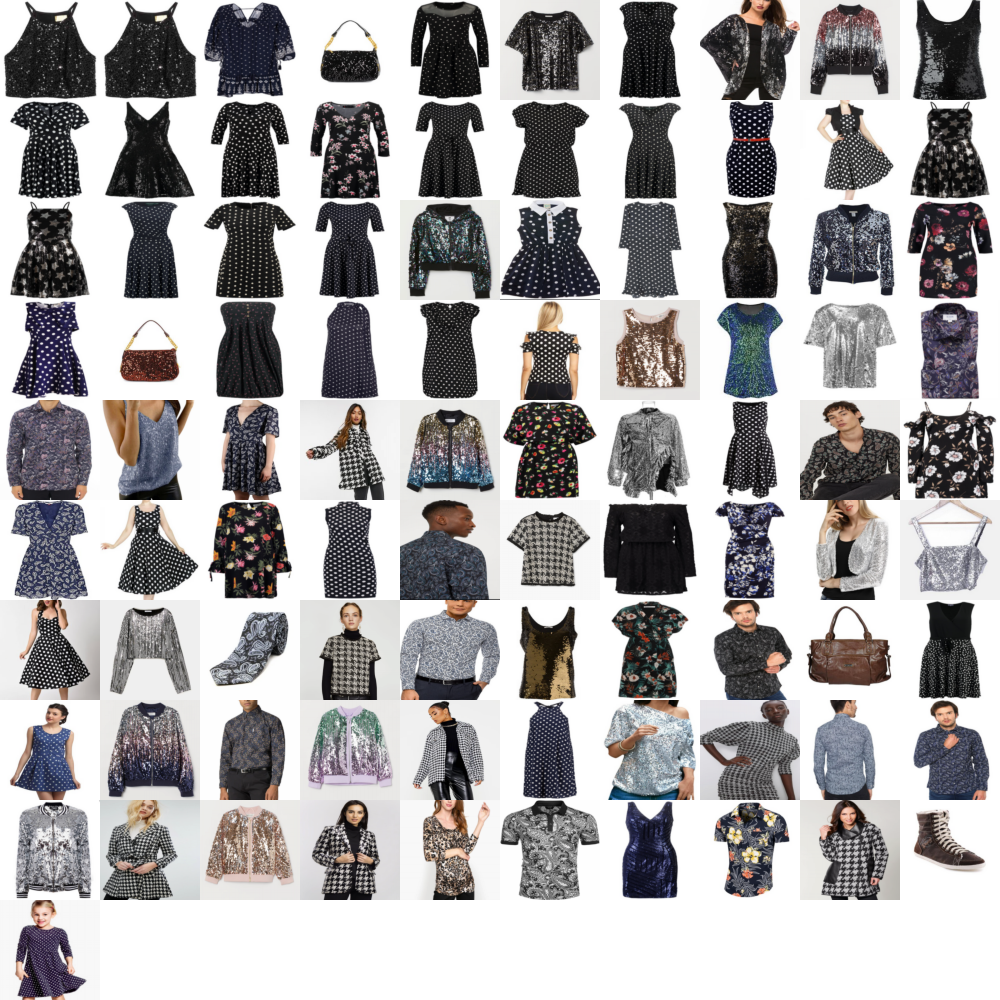

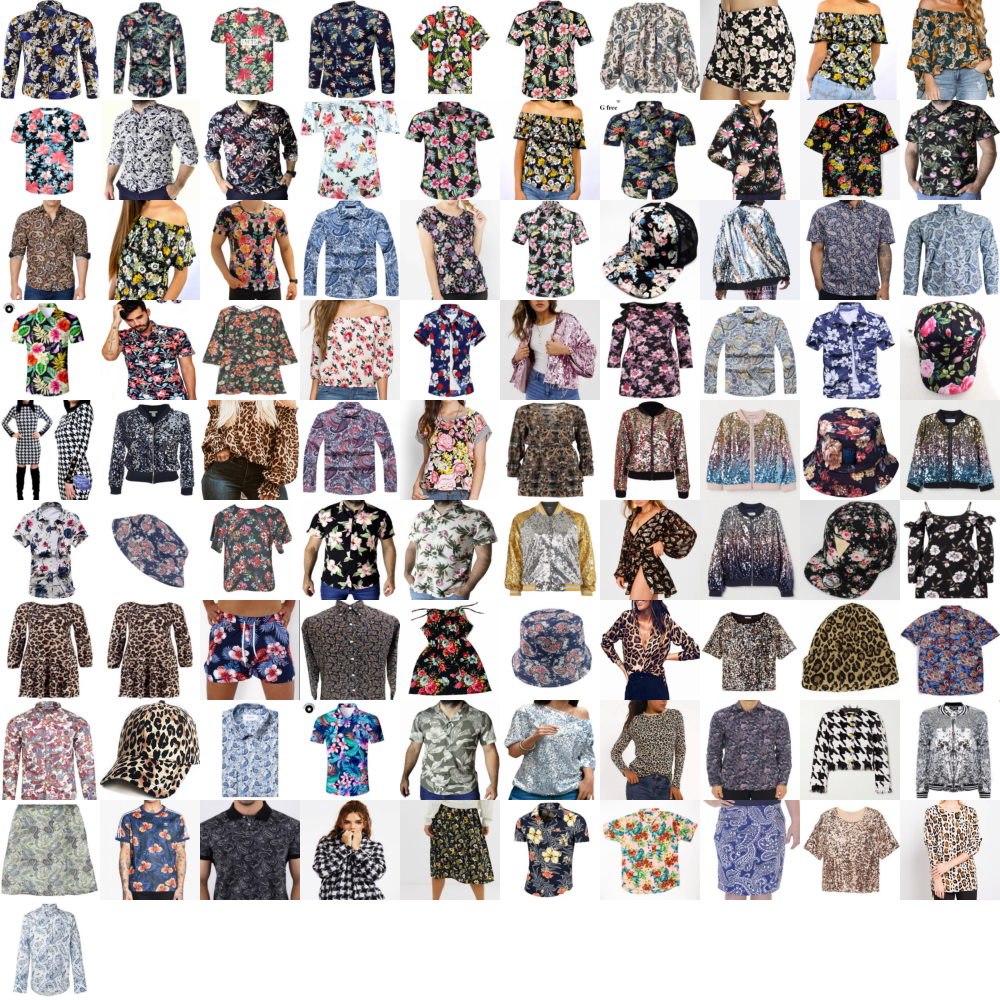

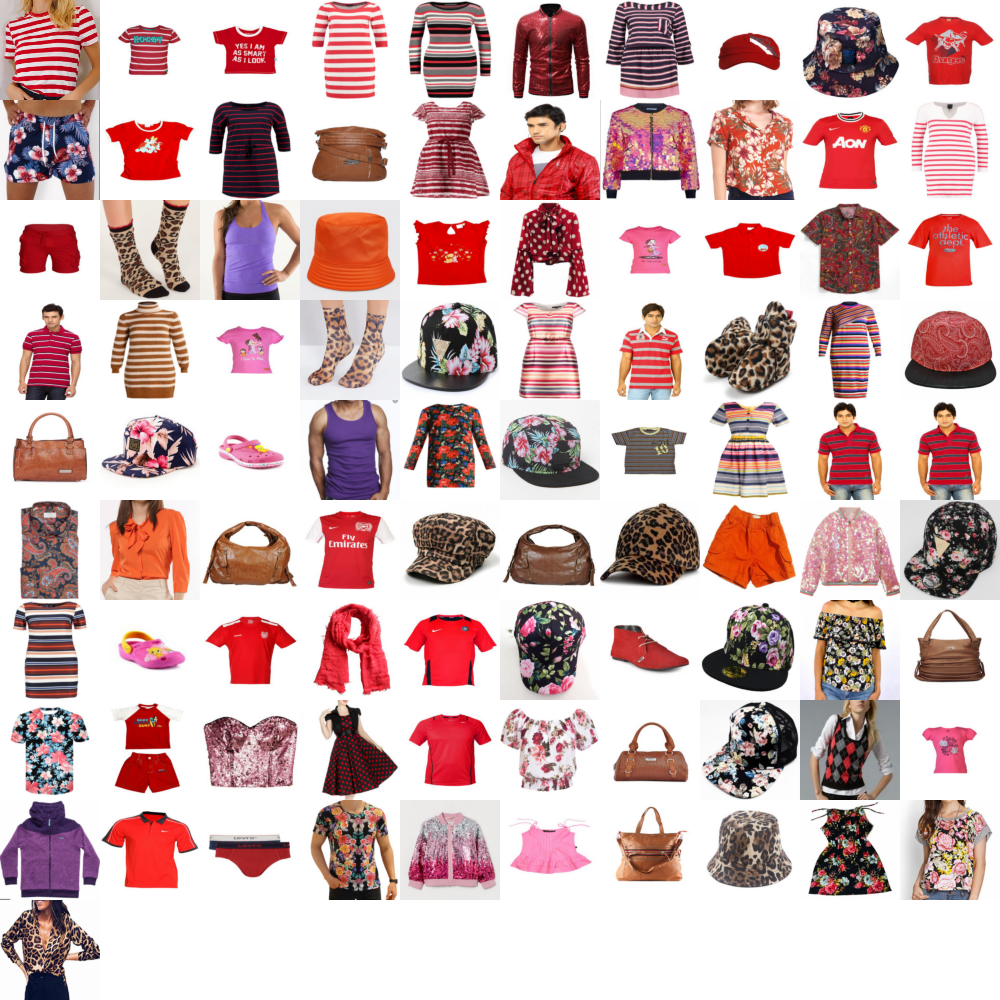

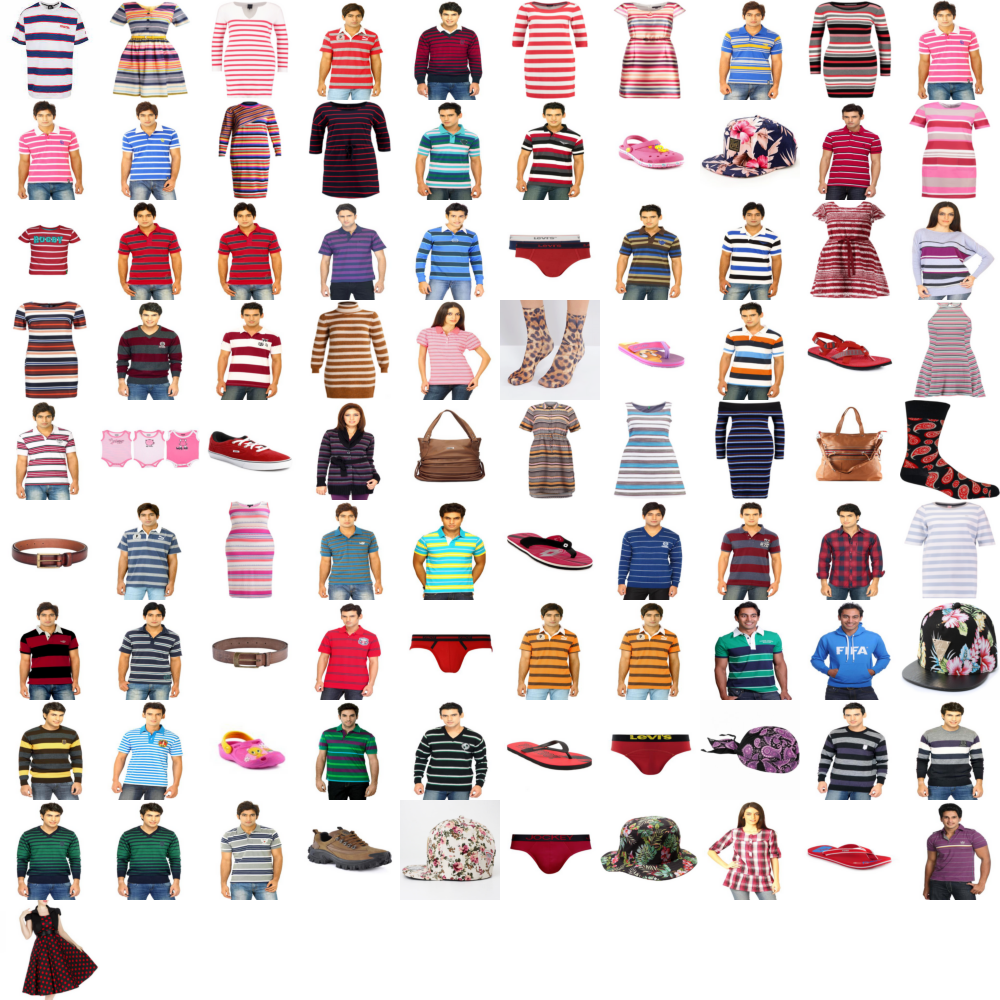

In [ ]:
from IPython.display import Image, display

display(Image('./25.png_cos_square_root_result.png', width=700, height=700))
display(Image('./flower_1.jpg_cos_square_root_result.png', width=700, height=700))
display(Image('./striped_1.jpeg_cos_square_root_result.png', width=700, height=700))
display(Image('./striped_2.jpeg_cos_square_root_result.png', width=700, height=700))

### Textura

In [ ]:
%cd /content/visual_attributes/
!python ssearch.py -config config/resnet50.config -name RESNET -mode search

/content/visual_attributes
2021-10-19 02:43:26.376018: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2021-10-19 02:43:26.386054: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2021-10-19 02:43:26.386864: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2021-10-19 02:43:26.388136: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2021-10-19 02:43:26.388953: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] succe

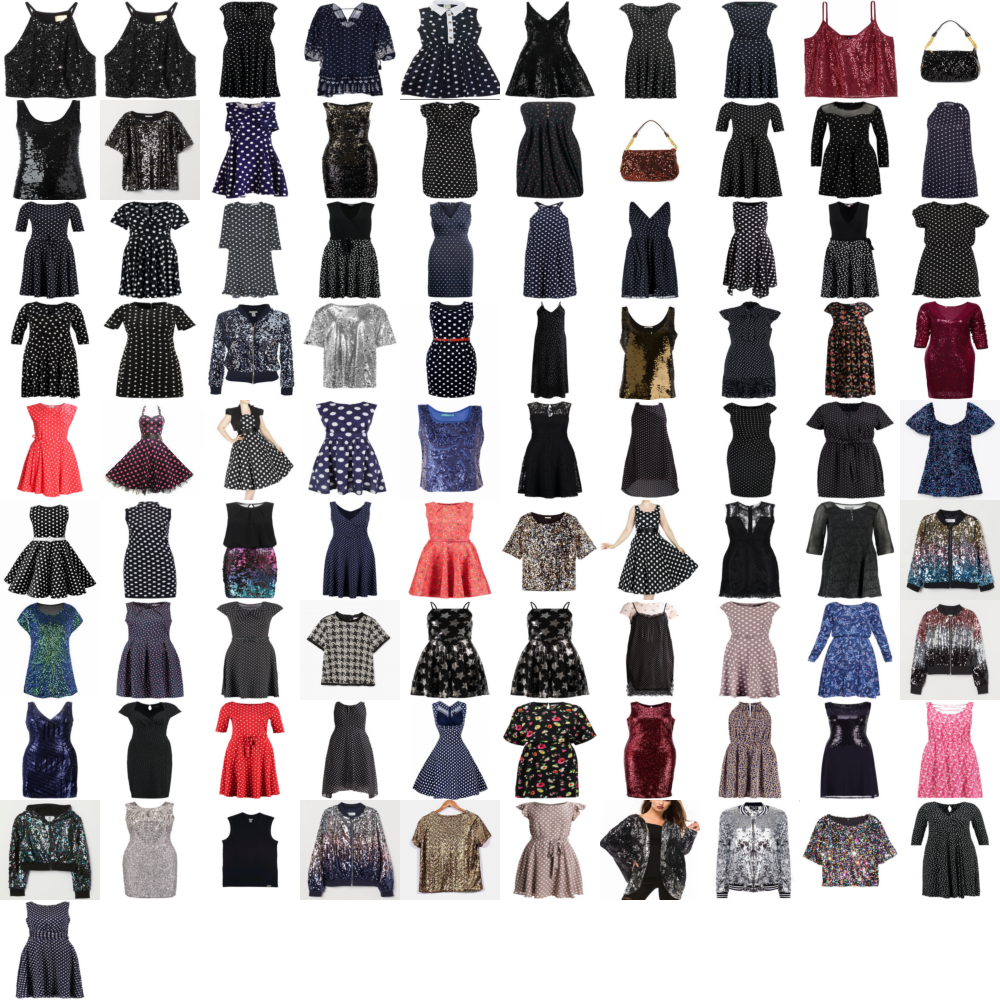

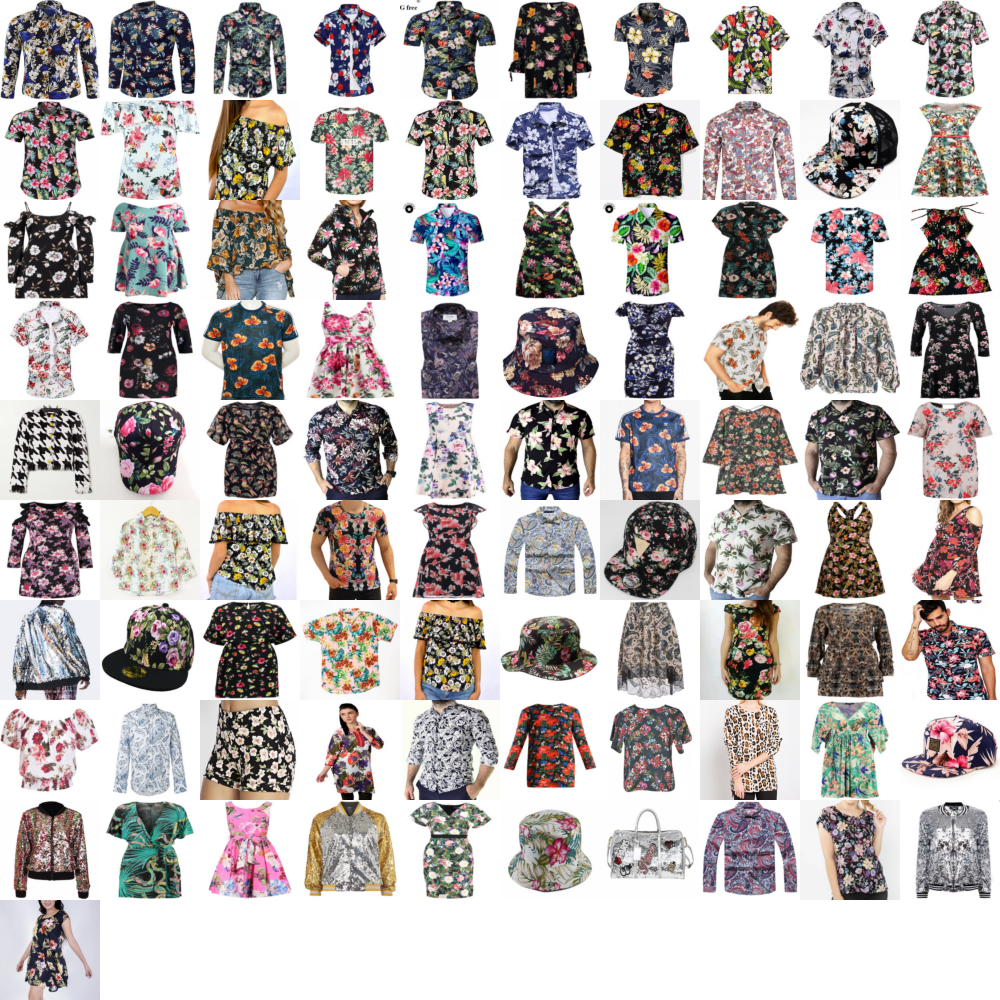

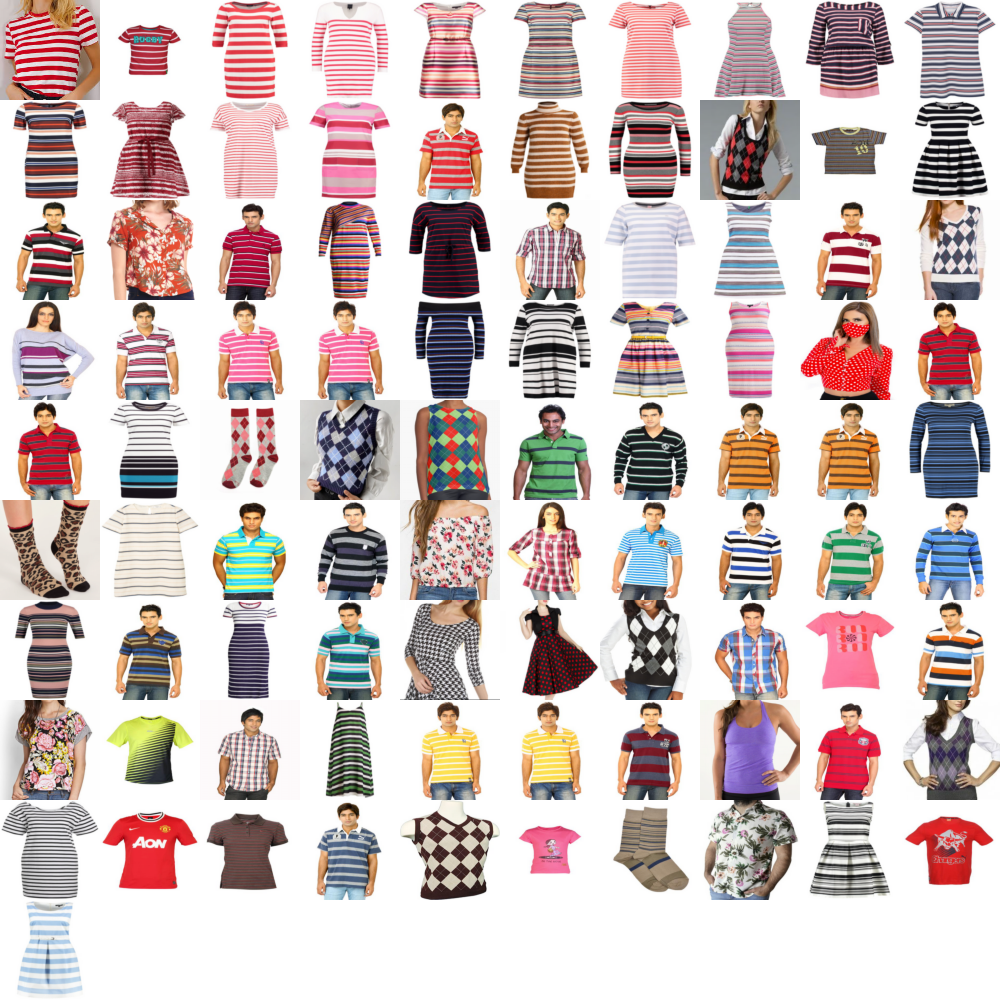

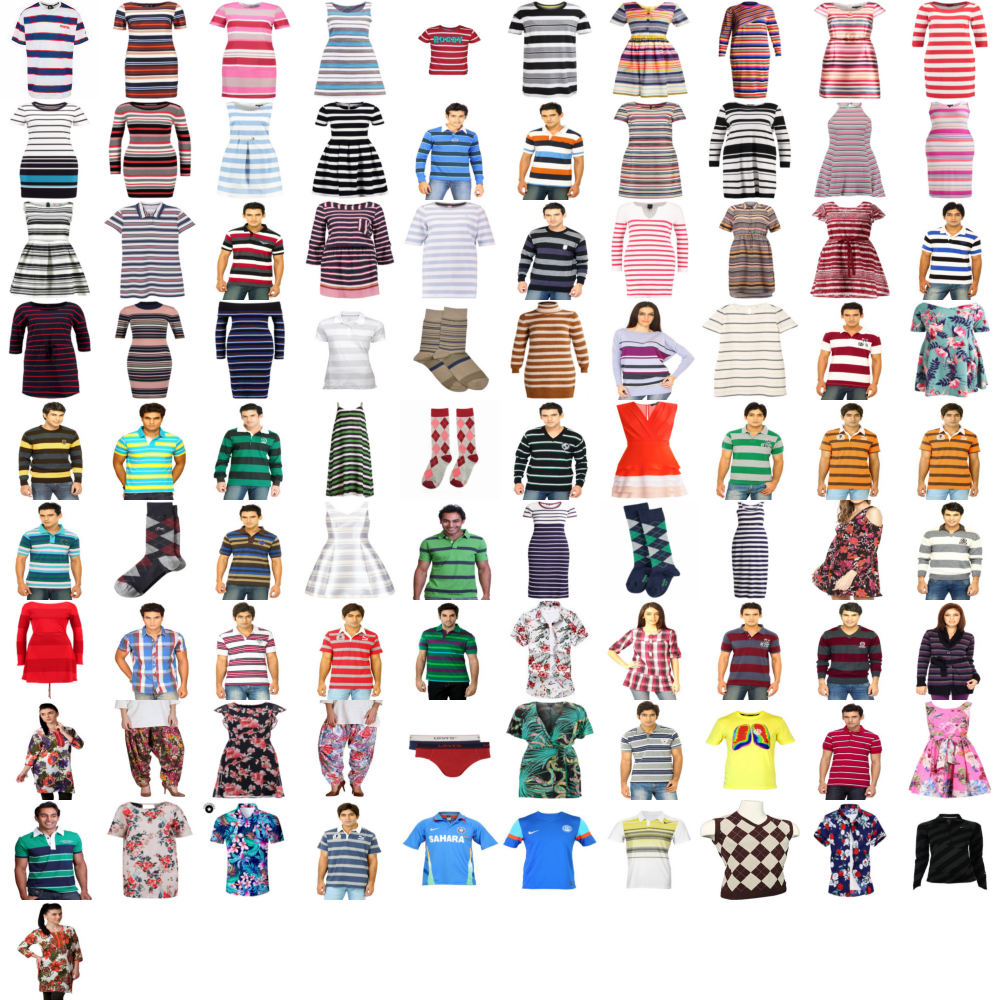

In [ ]:
display(Image('./25.png_cos_square_root_result.png', width=700, height=700))
display(Image('./flower_1.jpg_cos_square_root_result.png', width=700, height=700))
display(Image('./striped_1.jpeg_cos_square_root_result.png', width=700, height=700))
display(Image('./striped_2.jpeg_cos_square_root_result.png', width=700, height=700))